In [1]:
from plotly.offline import init_notebook_mode
import plotly.graph_objects as go
init_notebook_mode()
from PIL import Image
from RLtools.data_processing.stylusprofiler.debug_tulip import generate_report, CircleStructure
from RLtools.Utilities.file_io import get_fname, read_files_to_dict
from RLtools.data_processing.stylusprofiler.surfaceprofile import (results_folder,
        SurfaceProfile, add_profile_and_align, show_substrate, get_sample_rundata, blank_dektak_figure,
        report_etch_characteristics)

pre = (read_files_to_dict(results_folder + '/Pre Strip', '*.txt', SurfaceProfile))
post = (read_files_to_dict(results_folder + '/Post Strip', '*.txt', SurfaceProfile))
img = read_files_to_dict(results_folder + '\Post Strip\Images\Long SVC soak', '*.jpg')
sample_id = 33
s_id = str(sample_id)

# Sample 33
## Run Data


In [2]:
get_sample_rundata(sample_id)

,Process,carrier,HBr,Ar,Pressure mT,RF Power,ICP power,Temp,Time (min),Sample# Res C
10,6,Si wafer - not bonded,50,0,5.0,40,500,20,10,33.0


## Post Strip Micrograph

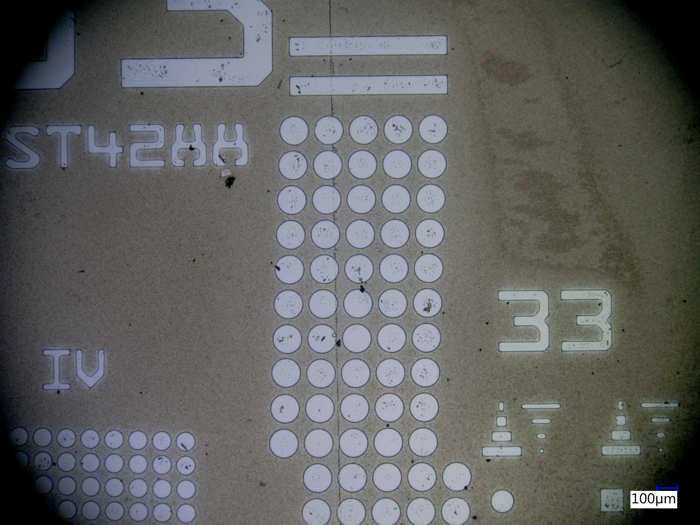

In [3]:
pic = Image.open(img[str(sample_id)])
pic.thumbnail((700,700))
pic

## Dektak Pre/Post Resist Strip Comparison


In [19]:
xxrange = [3100, 3700]
etch_depth = 0.45

f = blank_dektak_figure()           
add_profile_and_align(f, pre[s_id], 0, 0, name=f'{s_id} Pre-strip')
add_profile_and_align(f, post[s_id],3200-4300 + (3469-3438)-3,0.03,  name=f'{s_id} Post Strip')

f.update_xaxes(range=xxrange)
show_substrate(f, etch_depth)

In [20]:
report_etch_characteristics(pre, post, s_id, xxrange, etch_depth, verbose = True)

Total depth after etching is 8.810 um
Calculated remaining resist as 8.36um, indicating an erosion of 0.38um in 10 minutes of etching
This equates to an erosion rate of 38 nm/min
The etch depth of 0.45um in 10 mins indicates an etch rate of 45.0nm/min
The selectivity is therefore 1.18:1


,Result
Initial resist (um),8.741000
Total depth after etch (um),8.810500
Remaining resist (um),8.360500
Semiconductor etched(um),0.450000
Etch rate (nm/min),45.000000
Erosion rate (nm/min),38.050000
Selectivity,1.182654
